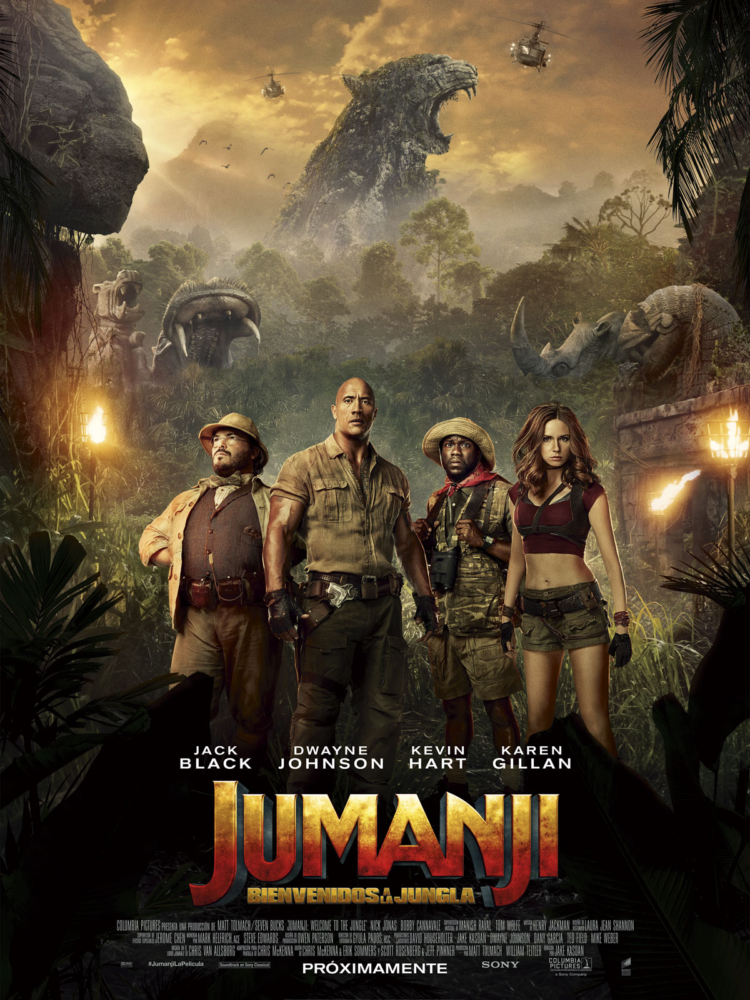

# Ejercicio Jumanji - Bienvenidos a la jungla

Wellcome to Jumanji dear adventurers. Unfortunately not everything are good news, some players have been playing to the game and, as a result of they dumb plays, a stampede of cats and dogs is now running in the real world.

As a fellow explorer I am sure that you understand the urgency of the situation. To solve it, we need to create a computer vision algorithm using CNNs to detect the cats and the dogs.

In order to do so we require the following steps:

- Create an image preprocessing pipeline to treat the images that we are providing. Perform data augmentation over the dataset, at least rotations.

- Test several architechtures (at least 3) and evaluate their performance over the dataset.

- Visualize the feature maps of some of the early and late layers of the models developed. ¿Is there any feature which could be explained through them?

- Finally select the model which performs the best over the whole dataset and explain why.

Fellow adventurer, thanks for your time, Jumanji will not forget your efforts.

#Grupo 1: Andreu, Sergi y Carmen

In [1]:
import random 
import pandas as pd
import numpy as np
import plotly.express as px
import matplotlib.pyplot as plt
from PIL import Image, ImageFilter, ImageOps, ImageEnhance
import random
import os
import tensorflow.keras as keras
from torch.utils.data import random_split
from glob import glob
from sklearn.model_selection import train_test_split
import shutil
from keras.preprocessing.image import array_to_img, img_to_array, load_img,image_dataset_from_directory
import matplotlib.pyplot as plt
import pandas as pd
import tensorflow as tf
from tensorflow.keras import layers
import numpy as np
import zipfile
import shutil
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.callbacks import ReduceLROnPlateau
from tensorflow.keras.callbacks import ModelCheckpoint

from keras.models import Sequential, load_model, Model
from keras.layers import Conv2D, MaxPooling2D, BatchNormalization, AveragePooling2D
from keras.layers import Activation, Dropout, Flatten, Dense, GlobalAveragePooling2D
from keras import optimizers
from keras.regularizers import l1, l2

%matplotlib inline
import glob
import matplotlib
from matplotlib import pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import imageio as im
from keras import models
from keras.models import Sequential
from keras.layers import Conv2D
from keras.layers import MaxPooling2D
from keras.layers import Flatten
from keras.layers import Dense
from keras.layers import Dropout
from keras.preprocessing import image
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import ModelCheckpoint

# 1.- Preprocesado de datos

In [2]:
# Funciones de aumento de datos

def data_aug(entry, i): # i = [ (0:rotation) , (1:blur) , (2:grises) , (3:bajo brillo) ]
    if i==0:
        return entry.rotate(random.randint(-45, 45))
    if i==1:
        return entry.filter(ImageFilter.BLUR)
    if i==2:
        #return ImageOps.grayscale(entry)
        return entry
    if i==3:
        return ImageEnhance.Brightness(entry).enhance(0.4)

In [3]:
%%capture
!wget --no-check-certificate \
    https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip \
    -O /content/cats_and_dogs_filtered.zip
!unzip cats_and_dogs_filtered.zip

In [4]:
base_dir = '/content/cats_and_dogs_filtered/'

#directorios con las imágenes de train
train_cats_dir = os.path.join(base_dir, 'train','cats')
train_dogs_dir = os.path.join(base_dir, 'train','dogs')

#directorios con las imágenes de validation
validation_cats_dir = os.path.join(base_dir, 'validation', 'cats')
validation_dogs_dir = os.path.join(base_dir, 'validation', 'dogs')

In [5]:
#Creamos nuevas carpetas para cats
test_cats_dir = '/content/cats_and_dogs_filtered/test/cats'
os.makedirs(test_cats_dir, exist_ok=True)

#Creamos nuevas carpetas para dogs
test_dogs_dir = '/content/cats_and_dogs_filtered/test/dogs'
os.makedirs(test_dogs_dir, exist_ok=True)

In [6]:
# Movemos 250 imágenes de gatos de validation a la carpeta test
for fname in random.sample(os.listdir('cats_and_dogs_filtered/validation/cats'), 250):
  shutil.move(f"cats_and_dogs_filtered/validation/cats/{fname}", f"cats_and_dogs_filtered/test/cats/{fname}") 

# Movemos 250 imágenes de perros de validation a la carpeta test
for fname in random.sample(os.listdir('cats_and_dogs_filtered/validation/dogs'), 250):
  shutil.move(f"cats_and_dogs_filtered/validation/dogs/{fname}", f"cats_and_dogs_filtered/test/dogs/{fname}") 

In [7]:
#Copiamos la carpeta validation para usar aumento de datos en una de ellas
  
src_path = 'cats_and_dogs_filtered/validation' 
dest_path = 'cats_and_dogs_filtered/validation_DA'
destination = shutil.copytree(src_path, dest_path)

validation_DA_cats_dir = os.path.join(base_dir, 'validation_DA','cats')
validation_DA_dogs_dir = os.path.join(base_dir, 'validation_DA','dogs')


In [8]:
print('Total train images - cats:', len(os.listdir(train_cats_dir ) ))
print('Total train images - dogs:', len(os.listdir(train_dogs_dir ) ))

print('Total test images - cats:', len(os.listdir(test_dogs_dir) ))
print('Total test images - dogs:', len(os.listdir(test_cats_dir) ))

print('Total validation images - cats:', len(os.listdir( validation_cats_dir ) ))
print('Total validation images - dogs:', len(os.listdir( validation_dogs_dir ) ))

print('Total validation_DA images - cats:', len(os.listdir(validation_DA_cats_dir) ))
print('Total validation_DA images - dogs:', len(os.listdir(validation_DA_dogs_dir) ))

Total train images - cats: 1000
Total train images - dogs: 1000
Total test images - cats: 250
Total test images - dogs: 250
Total validation images - cats: 250
Total validation images - dogs: 250
Total validation_DA images - cats: 250
Total validation_DA images - dogs: 250


In [9]:
# Selección aleatoria de 15% (máximo total posible 60%) de muestras del total para cada tipo de aumento de datos,
# por separado, así algunas se combinarán entre ellas.

n = 15  # % de muestras modificadas

for dir in (train_cats_dir, train_dogs_dir, validation_DA_cats_dir, validation_DA_dogs_dir):
  for i in range(0,4):  # i = [ (0:rotation) , (1:blur) , (2:grises) , (3:bajo brillo) ]
      #random.seed(123)
      randomlist = random.sample(os.listdir(dir), (n*len(os.listdir(dir)))//100 )
      for q in randomlist:
          img = Image.open(dir + '/' + q)
          img = data_aug(img, i)
          img = img.save(dir + '/' + q)

In [10]:
image_size = (180, 180)
batch_size = 32

train_ds = image_dataset_from_directory(
    "cats_and_dogs_filtered/train/",
    image_size=image_size,
    batch_size=batch_size,
    crop_to_aspect_ratio = True,
    label_mode='categorical'
)

test_ds = image_dataset_from_directory(
    "cats_and_dogs_filtered/test/",
    image_size=image_size,
    batch_size=batch_size,
    crop_to_aspect_ratio = True,
    label_mode='categorical'
)

validation_ds = image_dataset_from_directory(
    "cats_and_dogs_filtered/validation/",
    image_size=image_size,
    batch_size=batch_size,
    crop_to_aspect_ratio = True,
    label_mode='categorical'
)

validation_DA_ds = image_dataset_from_directory(
    "cats_and_dogs_filtered/validation_DA/",
    image_size=image_size, 
    batch_size=batch_size,
    crop_to_aspect_ratio = True,
    label_mode='categorical'
)

Found 2000 files belonging to 2 classes.
Found 500 files belonging to 2 classes.
Found 500 files belonging to 2 classes.
Found 500 files belonging to 2 classes.


In [11]:
def show_images_df(class_names,train_ds,range_img):
  plt.figure(figsize=(35,35))

  for images, labels in train_ds.take(1):
    for i in range(range_img):
      #print(i,images)
      ax = plt.subplot(4, 4, i + 1)
      plt.imshow(images[i].numpy().astype("uint8"))
      #plt.title(class_names[labels[i]])
      plt.axis("off")

#### 1.1.- Métodos

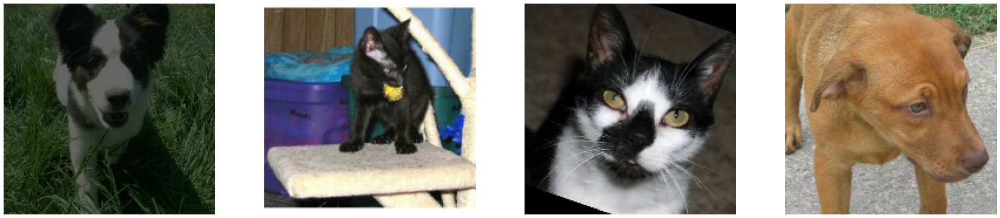

In [ ]:
show_images_df(train_ds.class_names,train_ds,4)

In [12]:
image_path= 'cats_and_dogs_filtered/train/cats/cat.11.jpg'
img = load_img(image_path, target_size=(180, 180))

In [13]:
#Visualización de las salidas de cada capa

def generate_layers_map(img, nlayer,model):
  intermediate_layer_model = Model(inputs=model.input, outputs=model.layers[nlayer].output)

  aux = np.expand_dims(img, axis=0)
  layer_out = intermediate_layer_model.predict(aux)

  plt.figure(figsize=(3,3))
  plt.imshow(img, cmap='gray')
  plt.title('input image', size=12)
  plt.xticks(())
  plt.yticks(())
  plt.show()

  print("Salidas capa "+intermediate_layer_model.layers[-1].name, layer_out.shape)

  noutputs = layer_out.shape[-1]
  ncols = 4
  nrows = int(np.ceil(noutputs / ncols))

  ma = abs(layer_out).max()

  plt.subplots(nrows,ncols,figsize = (12, 3*nrows))

  for i in range(noutputs):
      plt.subplot(nrows,ncols,i+1)
      plt.imshow(layer_out[0,:,:,i], cmap='viridis')
      plt.xticks(())
      plt.yticks(())
      plt.title('Salida filtro %d' % i, fontsize=10)

In [14]:
#Visualización de mapas de cararcterísticas

def generate_feature_map(model_B):
  img_path= 'cats_and_dogs_filtered/train/cats/cat.11.jpg'
  img = image.load_img(img_path, target_size=(180, 180))
  img_tensor = image.img_to_array(img)
  img_tensor = np.expand_dims(img_tensor, axis=0)
  img_tensor /= 255.
  plt.imshow(img_tensor[0])
  plt.show()
  print(img_tensor.shape)

  x = image.img_to_array(img)
  x = np.expand_dims(x, axis=0)
  images = np.vstack([x])
  classes = model_B.predict(images, batch_size=10)
  print("Predicted class is:",classes)

  layer_outputs = [layer.output for layer in model_B.layers[:12]] # Extracts the outputs of the top 12 layers
  activation_model = models.Model(inputs=model_B.input, outputs=layer_outputs) # Creates a model that will return these outputs, given the model input

  activations = activation_model.predict(img_tensor) # Returns a list of five Numpy arrays: one array per layer activation
  first_layer_activation = activations[0]


  layer_names = []
  for layer in model_B.layers[:12]:
      layer_names.append(layer.name) # Names of the layers, so you can have them as part of your plot
      
  images_per_row = 16
  for layer_name, layer_activation in zip(layer_names, activations): # Displays the feature maps
      n_features = layer_activation.shape[-1] # Number of features in the feature map
      size = layer_activation.shape[1] #The feature map has shape (1, size, size, n_features).
      n_cols = n_features // images_per_row # Tiles the activation channels in this matrix
      display_grid = np.zeros((size * n_cols, images_per_row * size))
      for col in range(n_cols): # Tiles each filter into a big horizontal grid
          for row in range(images_per_row):
              channel_image = layer_activation[0,
                                              :, :,
                                              col * images_per_row + row]
              channel_image -= channel_image.mean() # Post-processes the feature to make it visually palatable
              channel_image /= channel_image.std()
              channel_image *= 64
              channel_image += 128
              channel_image = np.clip(channel_image, 0, 255).astype('uint8')
              display_grid[col * size : (col + 1) * size, # Displays the grid
                          row * size : (row + 1) * size] = channel_image

      scale = 1. / size
      plt.figure(figsize=(scale * display_grid.shape[1],
                          scale * 90))
      plt.title(layer_name)
      plt.grid(False)
      plt.imshow(display_grid, aspect='auto', cmap='viridis')

In [15]:
def plot_model(history):
  df = pd.DataFrame(history.history)
  df_losses = df[['loss', 'val_loss']]
  df_acc = df[['accuracy', 'val_accuracy']]
  df_acc.plot(figsize=(8,5))
  df_losses.plot(figsize=(8,5))

# 2.- Entrenamiento y evaluación de 3 arquitecturas distintas

## 2.1.- Modelo A


Preparamos las funciones siguientes para usar durante el entrenamiento:

In [28]:
callbacks = [
 	EarlyStopping(patience=15, monitor='val_loss', restore_best_weights=True),

	ReduceLROnPlateau(monitor='val_loss', min_lr=1e-7, patience=5, mode='min', verbose=1, factor=0.5),

	ModelCheckpoint(monitor='val_loss', filepath='./best_model.h5', save_best_only=True)
]

Definimos el modelo A:

In [32]:
def mod_A():
  model_A = keras.Sequential([
    layers.Input((180, 180, 3)),
    layers.Rescaling(scale=1./255), # rescale between 0 and 1
    
    layers.Conv2D(32, 5, activation="relu"),
    layers.MaxPooling2D(),
    layers.BatchNormalization(),  
    
    layers.Conv2D(64, 3, activation="relu"),
    layers.MaxPooling2D(),
    layers.BatchNormalization(),  
    
    layers.Conv2D(128, 3, activation="relu"),
    layers.MaxPooling2D(),
    layers.BatchNormalization(),  
    
    layers.Conv2D(256, 3, activation="relu"),
    layers.MaxPooling2D(),
    layers.BatchNormalization(),  
    
    layers.Flatten(),
    
    layers.Dense(256, activation="relu"),
    layers.BatchNormalization(), 
    layers.Dropout(0.4),
    
    layers.Dense(128, activation="relu"),
    layers.BatchNormalization(), 
    layers.Dropout(0.3),
    
    layers.Dense(64, activation="relu"),
    layers.BatchNormalization(),
    layers.Dropout(0.3),
  
    layers.Dense(2, activation="sigmoid") # sigmoid for binary classification   
])
  return model_A

Compilamos y entrenamos el modelo A **sin** aumento de datos en el set de validación:

In [33]:
#Modelo A sin aumento de datos
model_A = mod_A()
model_A.compile(
    optimizer = keras.optimizers.Adam(learning_rate=0.01),
    loss='categorical_crossentropy',
    metrics=["accuracy"]
)
model_A.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_1 (Rescaling)     (None, 180, 180, 3)       0         
                                                                 
 conv2d_14 (Conv2D)          (None, 176, 176, 32)      2432      
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 88, 88, 32)       0         
 2D)                                                             
                                                                 
 batch_normalization_7 (Batc  (None, 88, 88, 32)       128       
 hNormalization)                                                 
                                                                 
 conv2d_15 (Conv2D)          (None, 86, 86, 64)        18496     
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 43, 43, 64)      

In [34]:
history_A = model_A.fit(train_ds, epochs=20, callbacks=callbacks, validation_data=validation_ds)

Epoch 1/20
63/63 [==============================] - 6s 75ms/step - loss: 0.8192 - accuracy: 0.5405 - val_loss: 2.6174 - val_accuracy: 0.5000 - lr: 0.0100
Epoch 2/20
63/63 [==============================] - 5s 68ms/step - loss: 0.6697 - accuracy: 0.5990 - val_loss: 0.8629 - val_accuracy: 0.4680 - lr: 0.0100
Epoch 3/20
63/63 [==============================] - 5s 72ms/step - loss: 0.6508 - accuracy: 0.6225 - val_loss: 0.7883 - val_accuracy: 0.5500 - lr: 0.0100
Epoch 4/20
63/63 [==============================] - 5s 68ms/step - loss: 0.6369 - accuracy: 0.6515 - val_loss: 0.7165 - val_accuracy: 0.6060 - lr: 0.0100
Epoch 5/20
63/63 [==============================] - 5s 67ms/step - loss: 0.6139 - accuracy: 0.6720 - val_loss: 2.1926 - val_accuracy: 0.5280 - lr: 0.0100
Epoch 6/20
63/63 [==============================] - 5s 67ms/step - loss: 0.6004 - accuracy: 0.6825 - val_loss: 0.7335 - val_accuracy: 0.5800 - lr: 0.0100
Epoch 7/20
63/63 [==============================] - 5s 67ms/step - loss: 0.5

Visualizamos la evolución de las métricas y las pérdidas del train y validation:

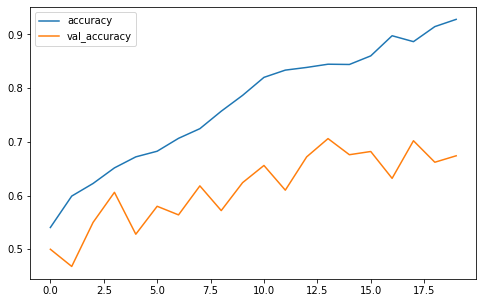

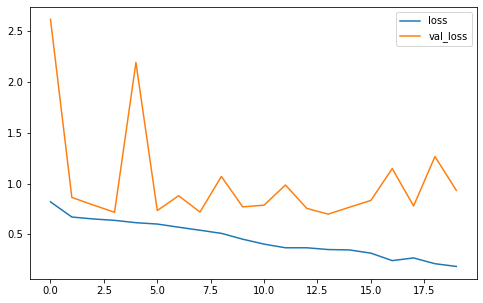

In [35]:
# Curvas modelo SIN aumento de datos
plot_model(history_A)

Repetimos el procedimiento esta vez **con** aumento de datos en el conjunto de validación:


In [36]:
#Modelo A con aumento de datos
model_A_DA = mod_A()
model_A_DA.compile(
    optimizer = keras.optimizers.Adam(learning_rate=0.01),
    loss='categorical_crossentropy',
    metrics=["accuracy"]
)
model_A_DA.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_2 (Rescaling)     (None, 180, 180, 3)       0         
                                                                 
 conv2d_18 (Conv2D)          (None, 176, 176, 32)      2432      
                                                                 
 max_pooling2d_8 (MaxPooling  (None, 88, 88, 32)       0         
 2D)                                                             
                                                                 
 batch_normalization_14 (Bat  (None, 88, 88, 32)       128       
 chNormalization)                                                
                                                                 
 conv2d_19 (Conv2D)          (None, 86, 86, 64)        18496     
                                                                 
 max_pooling2d_9 (MaxPooling  (None, 43, 43, 64)      

In [37]:
history_A_DA = model_A_DA.fit(train_ds, epochs=20, callbacks=callbacks, validation_data=validation_DA_ds)

Epoch 1/20
63/63 [==============================] - 6s 71ms/step - loss: 0.8001 - accuracy: 0.5280 - val_loss: 6.5754 - val_accuracy: 0.5060 - lr: 0.0100
Epoch 2/20
63/63 [==============================] - 5s 67ms/step - loss: 0.6999 - accuracy: 0.5595 - val_loss: 1.7520 - val_accuracy: 0.5120 - lr: 0.0100
Epoch 3/20
63/63 [==============================] - 5s 68ms/step - loss: 0.6758 - accuracy: 0.5780 - val_loss: 0.8306 - val_accuracy: 0.5040 - lr: 0.0100
Epoch 4/20
63/63 [==============================] - 5s 68ms/step - loss: 0.6607 - accuracy: 0.6105 - val_loss: 0.7765 - val_accuracy: 0.6040 - lr: 0.0100
Epoch 5/20
63/63 [==============================] - 5s 67ms/step - loss: 0.6280 - accuracy: 0.6390 - val_loss: 0.8153 - val_accuracy: 0.5240 - lr: 0.0100
Epoch 6/20
63/63 [==============================] - 5s 71ms/step - loss: 0.6031 - accuracy: 0.6755 - val_loss: 0.6759 - val_accuracy: 0.5760 - lr: 0.0100
Epoch 7/20
63/63 [==============================] - 4s 67ms/step - loss: 0.5

Visualizamos la evolución de las métricas y las pérdidas de train y validation_DA:

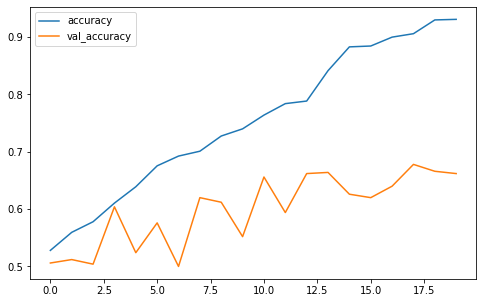

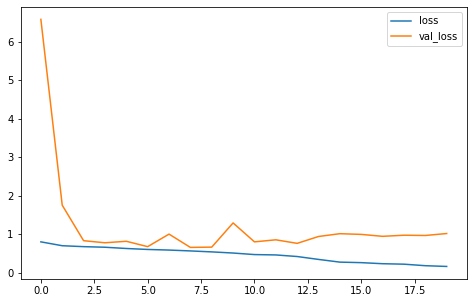

In [38]:
# Curvas modelo CON aumento de datos
plot_model(history_A_DA)

Evaluamos los dos modelos A entrenados.

In [39]:
#Sin DA
model_A.evaluate(test_ds, callbacks=callbacks)

16/16 [==============================] - 1s 35ms/step - loss: 0.8754 - accuracy: 0.6780


[0.8753559589385986, 0.6779999732971191]

In [40]:
#Con DA
model_A_DA.evaluate(test_ds, callbacks=callbacks)

16/16 [==============================] - 1s 35ms/step - loss: 0.9547 - accuracy: 0.6880


[0.9546589851379395, 0.6880000233650208]

Después de realizar varios entrenamientos con aumento de datos y sin aumento en validación, no se observan diferencias entre ambos.

Visualizamos ahora los mapas de características y activación de las primeras y últimas capas del modelo con aumento de datos:

In [ ]:
model_A_DA.layers

Mapa de activación a la salida de la segunda capa convolucional:

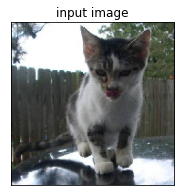

Salidas capa conv2d_1 (1, 86, 86, 64)


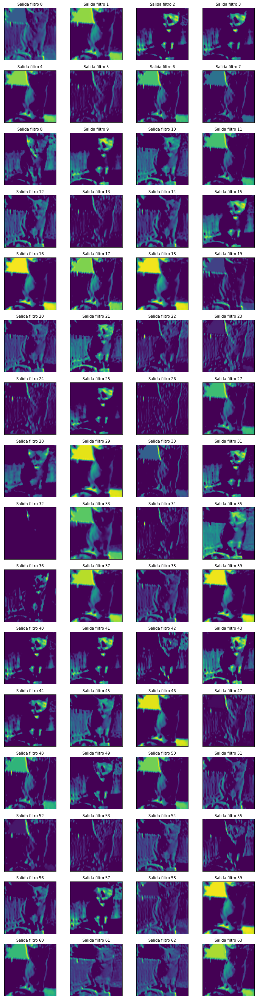

In [ ]:
generate_layers_map(img,4,model_A_DA)

Mapa de activación después de la última capa de batch normalization:

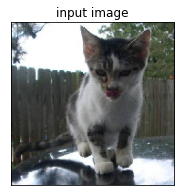

Salidas capa batch_normalization_3 (1, 9, 9, 256)


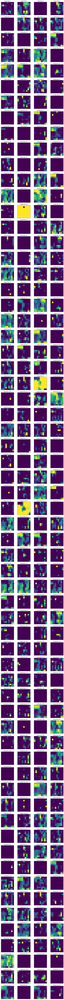

In [ ]:
generate_layers_map(img,12,model_A_DA)

Visualizamos los mapas de características de las distintas capas:

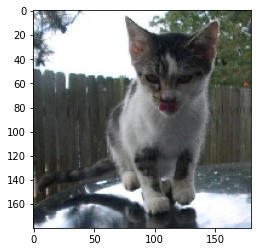

(1, 180, 180, 3)
Predicted class is: [[0.97051245 0.05160078]]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:54: UserWarning:

Attempting to set identical bottom == top == -0.5 results in singular transformations; automatically expanding.

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:42: RuntimeWarning:

invalid value encountered in true_divide

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:42: RuntimeWarning:

divide by zero encountered in true_divide



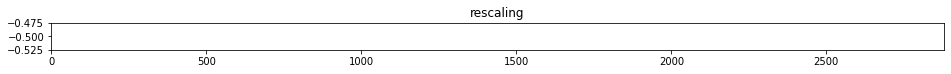

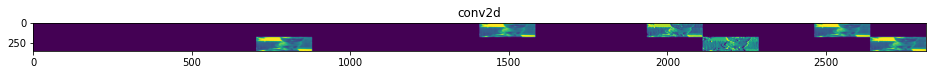

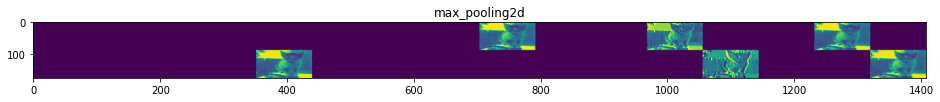

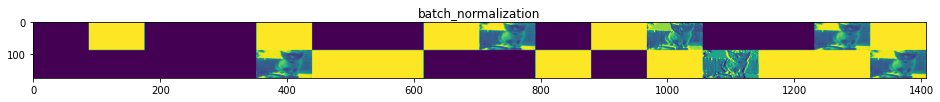

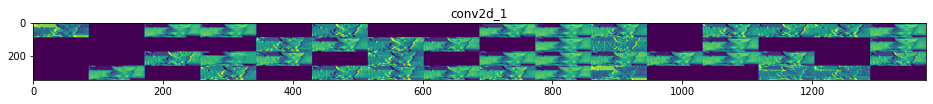

...

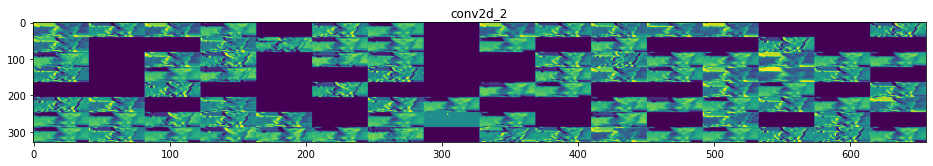

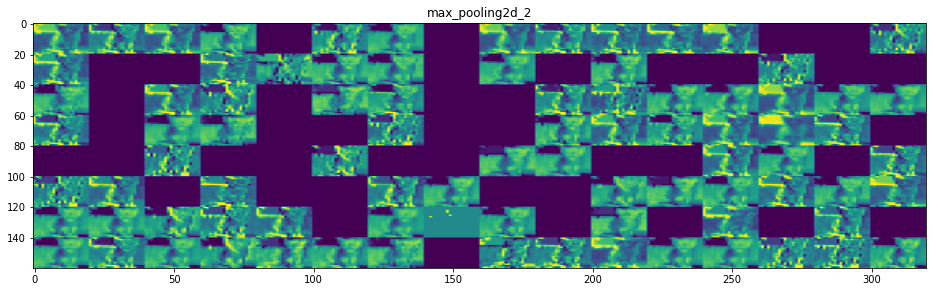

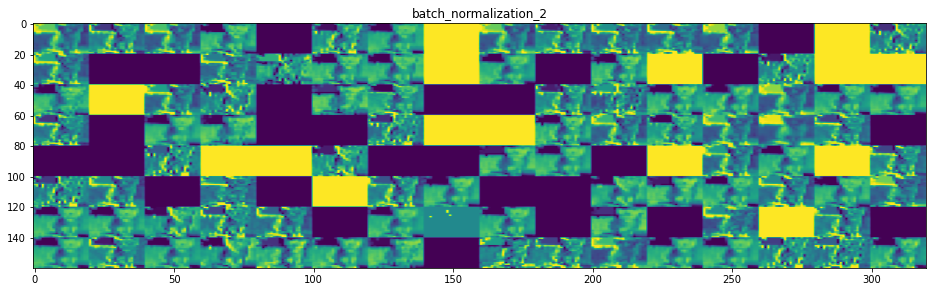

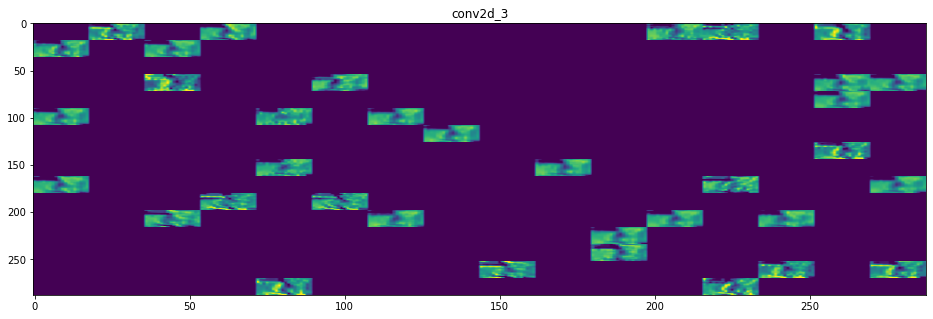

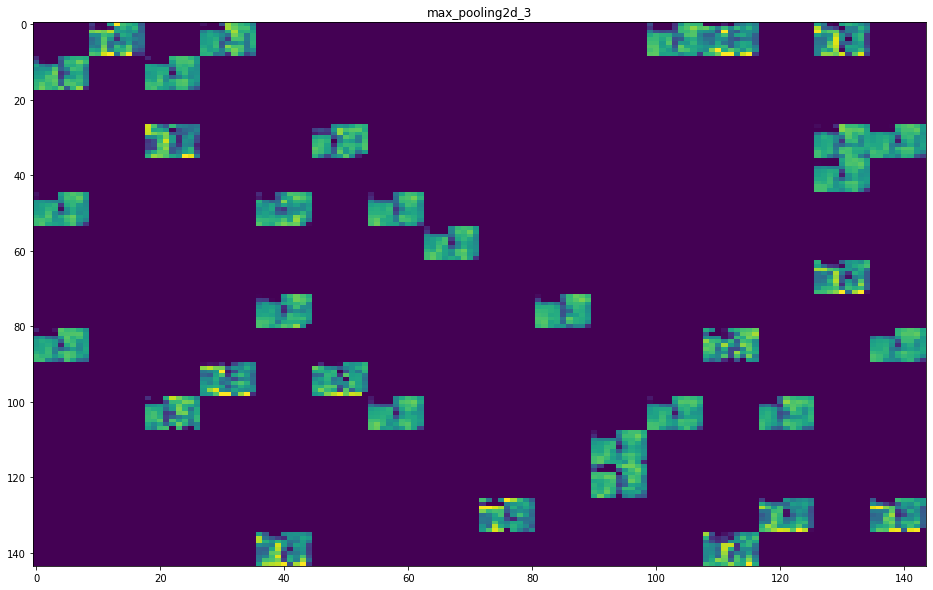

In [ ]:
generate_feature_map(model_A)

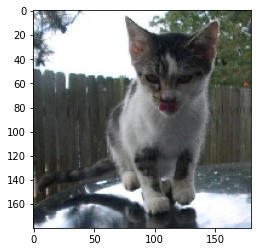

(1, 180, 180, 3)
Predicted class is: [[0.97051245 0.05160078]]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:54: UserWarning:

Attempting to set identical bottom == top == -0.5 results in singular transformations; automatically expanding.

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:42: RuntimeWarning:

invalid value encountered in true_divide

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:42: RuntimeWarning:

divide by zero encountered in true_divide



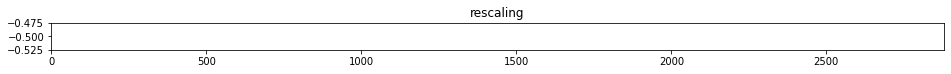

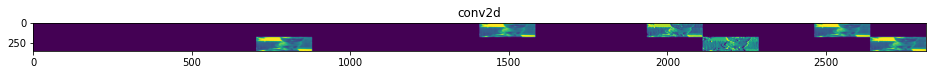

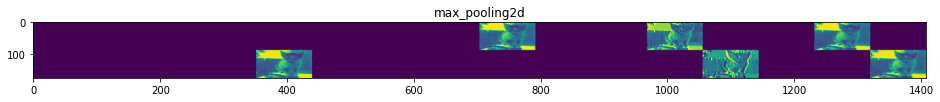

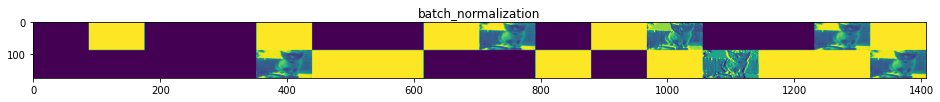

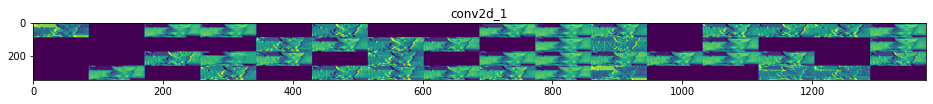

...

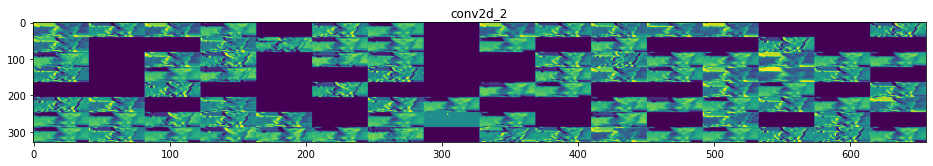

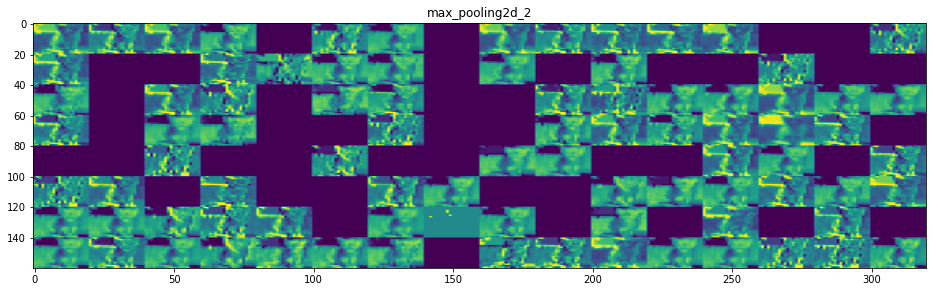

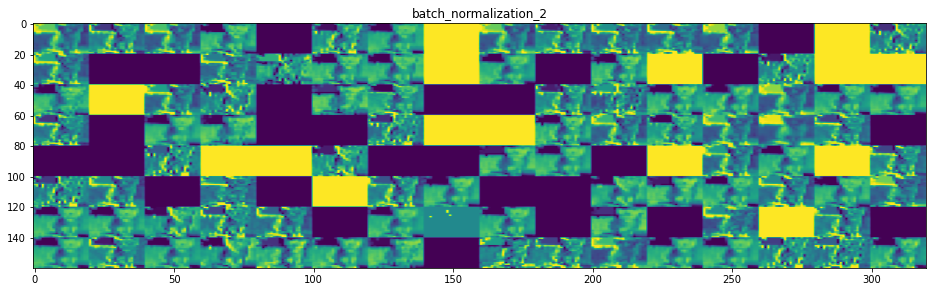

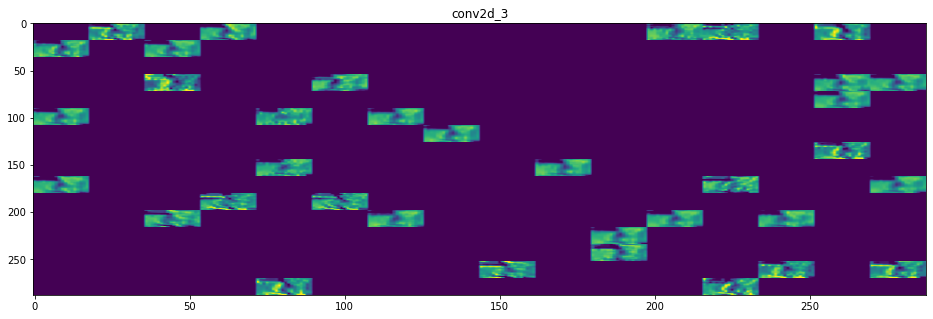

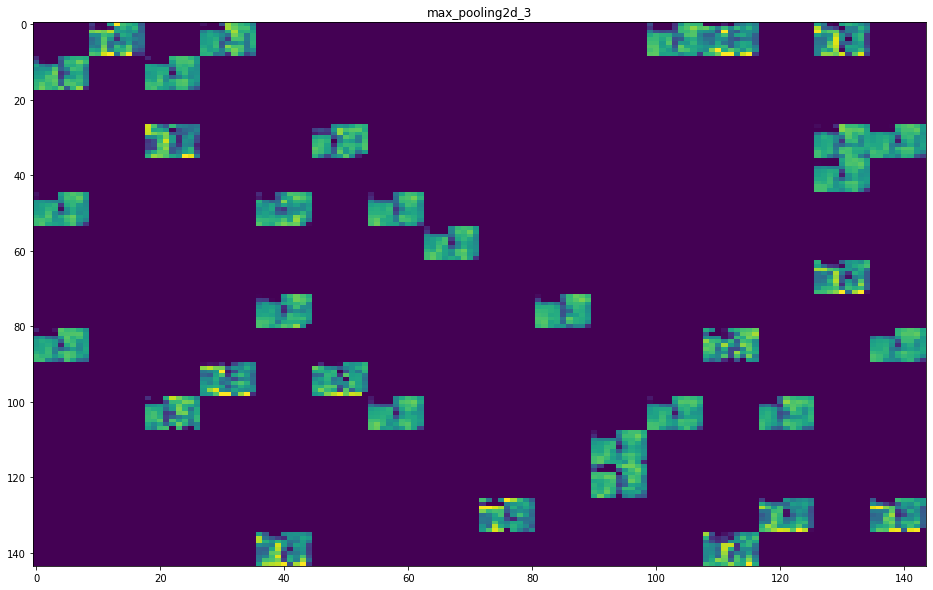

In [ ]:
generate_feature_map(model_A_DA)

## 2.2.- Modelo B

Preparamos las funciones siguientes para usar durante el entrenamiento:

In [16]:
callbacks_B = [
 	EarlyStopping(patience=15, monitor='val_loss', restore_best_weights=True),

	ReduceLROnPlateau(monitor='val_loss', min_lr=1e-7, patience=5, mode='min', verbose=1, factor=0.5),

	ModelCheckpoint(monitor='val_loss', filepath='./best_model.h5', save_best_only=True)
]

Definimos el modelo B:

In [17]:
def mod_B():
  input_lyr = keras.layers.Input(shape=(180,180,3))
  conv_lyr1 = keras.layers.Conv2D(32, kernel_size=(3,3),
                                input_shape=(180,180,3),
                                activation='relu',
                                padding="same",
                                data_format="channels_last")(input_lyr)
  pool1 = keras.layers.AveragePooling2D(pool_size=(2,2), strides=(2,2))(conv_lyr1)                               
  conv_lyr2 = keras.layers.Conv2D(32, kernel_size=(3,3),
                                activation='relu',
                                padding="same",
                                data_format="channels_last")(pool1)
  pool2 = keras.layers.AveragePooling2D(pool_size=(2,2), strides=(2,2))(conv_lyr2)
  conv_lyr3 = keras.layers.Conv2D(64, kernel_size=(5,5),
                                activation='relu',
                                padding="same",
                                data_format="channels_last")(pool2)
  pool3 = keras.layers.AveragePooling2D(pool_size=(2,2), strides=(2,2))(conv_lyr3)   
  conv_lyr4 = keras.layers.Conv2D(128, kernel_size=(5,5),
                                activation='relu',
                                padding="same",
                                data_format="channels_last")(pool3)
  pool4 = keras.layers.AveragePooling2D(pool_size=(2,2), strides=(2,2))(conv_lyr4)
  conv_lyr5 = keras.layers.Conv2D(256, kernel_size=(3,3),
                                activation='relu',
                                padding="same",
                                data_format="channels_last")(pool4)
  pool5 = keras.layers.AveragePooling2D(pool_size=(2,2), strides=(2,2))(conv_lyr5)

  dropout1 = keras.layers.Dropout(0.5)(pool5)
  flat_lyr = keras.layers.Flatten(data_format="channels_last")(dropout1)

  dense_lyr1 = keras.layers.Dense(64, activation='relu', kernel_regularizer='l2')(flat_lyr)
  dropout2 = keras.layers.Dropout(0.5)(dense_lyr1)
  dense_lyr2 = keras.layers.Dense(32, activation='relu')(dropout2)
  dropout3 = keras.layers.Dropout(0.5)(dense_lyr2)
  dense_lyr3 = keras.layers.Dense(2, activation='softmax')(dropout3)

  return keras.Model(inputs=input_lyr, outputs=dense_lyr3)

Compilamos y entrenamos el modelo B **sin** aumento de datos en el conjunto de validación:

In [18]:
# Modelo B sin aumento de datos
model_B = mod_B()
model_B.compile(optimizer= tf.keras.optimizers.RMSprop(learning_rate=0.00001) , loss='categorical_crossentropy',
              metrics=['accuracy'])
model_B.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 180, 180, 3)]     0         
                                                                 
 conv2d (Conv2D)             (None, 180, 180, 32)      896       
                                                                 
 average_pooling2d (AverageP  (None, 90, 90, 32)       0         
 ooling2D)                                                       
                                                                 
 conv2d_1 (Conv2D)           (None, 90, 90, 32)        9248      
                                                                 
 average_pooling2d_1 (Averag  (None, 45, 45, 32)       0         
 ePooling2D)                                                     
                                                                 
 conv2d_2 (Conv2D)           (None, 45, 45, 64)        51264 

In [19]:
history_B = model_B.fit(train_ds, epochs=200, callbacks=callbacks_B, validation_data=validation_ds)

Epoch 1/200
63/63 [==============================] - 16s 72ms/step - loss: 4.5977 - accuracy: 0.5065 - val_loss: 2.0608 - val_accuracy: 0.5000 - lr: 1.0000e-05
Epoch 2/200
63/63 [==============================] - 4s 62ms/step - loss: 2.6967 - accuracy: 0.4950 - val_loss: 1.9363 - val_accuracy: 0.4900 - lr: 1.0000e-05
Epoch 3/200
63/63 [==============================] - 4s 61ms/step - loss: 2.2273 - accuracy: 0.4780 - val_loss: 1.9135 - val_accuracy: 0.5140 - lr: 1.0000e-05
Epoch 4/200
63/63 [==============================] - 4s 60ms/step - loss: 2.0204 - accuracy: 0.5030 - val_loss: 1.8935 - val_accuracy: 0.5080 - lr: 1.0000e-05
Epoch 5/200
63/63 [==============================] - 4s 60ms/step - loss: 1.9830 - accuracy: 0.4910 - val_loss: 1.8739 - val_accuracy: 0.5260 - lr: 1.0000e-05
Epoch 6/200
63/63 [==============================] - 4s 60ms/step - loss: 1.9122 - accuracy: 0.5005 - val_loss: 1.8526 - val_accuracy: 0.5220 - lr: 1.0000e-05
Epoch 7/200
63/63 [==========================

Visualizamos la evolución de las métricas y las pérdidas de train y validation:

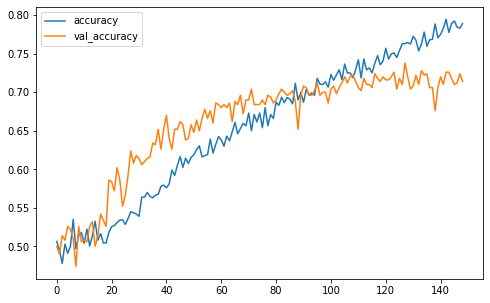

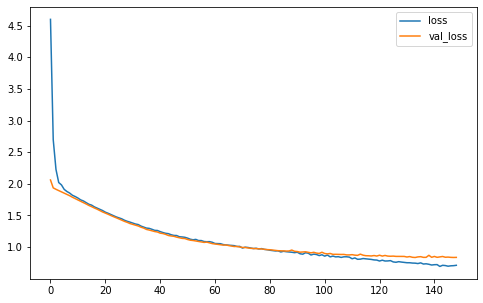

In [24]:
# Curvas modelo SIN aumento de datos
plot_model(history_B)

Repetimos el procedimiento esta vez **con** aumento de datos en el conjunto de validación:

In [21]:
#Modelo B con aumento de datos
model_B_DA = mod_B()
model_B_DA.compile(optimizer= tf.keras.optimizers.RMSprop(learning_rate=0.00001) , loss='categorical_crossentropy',
              metrics=['accuracy'])
model_B_DA.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 180, 180, 3)]     0         
                                                                 
 conv2d_5 (Conv2D)           (None, 180, 180, 32)      896       
                                                                 
 average_pooling2d_5 (Averag  (None, 90, 90, 32)       0         
 ePooling2D)                                                     
                                                                 
 conv2d_6 (Conv2D)           (None, 90, 90, 32)        9248      
                                                                 
 average_pooling2d_6 (Averag  (None, 45, 45, 32)       0         
 ePooling2D)                                                     
                                                                 
 conv2d_7 (Conv2D)           (None, 45, 45, 64)        5126

In [23]:
history_B_DA = model_B_DA.fit(train_ds, epochs=200, callbacks=callbacks_B, validation_data=validation_DA_ds)

Epoch 1/200
63/63 [==============================] - 5s 65ms/step - loss: 4.6985 - accuracy: 0.5010 - val_loss: 2.0030 - val_accuracy: 0.5060 - lr: 1.0000e-05
Epoch 2/200
63/63 [==============================] - 4s 61ms/step - loss: 2.7092 - accuracy: 0.5120 - val_loss: 1.9424 - val_accuracy: 0.5180 - lr: 1.0000e-05
Epoch 3/200
63/63 [==============================] - 4s 60ms/step - loss: 2.2847 - accuracy: 0.5015 - val_loss: 1.9334 - val_accuracy: 0.4940 - lr: 1.0000e-05
Epoch 4/200
63/63 [==============================] - 4s 60ms/step - loss: 2.1019 - accuracy: 0.4920 - val_loss: 1.9064 - val_accuracy: 0.5380 - lr: 1.0000e-05
Epoch 5/200
63/63 [==============================] - 4s 59ms/step - loss: 2.0161 - accuracy: 0.4880 - val_loss: 1.8934 - val_accuracy: 0.5440 - lr: 1.0000e-05
Epoch 6/200
63/63 [==============================] - 4s 59ms/step - loss: 1.9378 - accuracy: 0.5120 - val_loss: 1.8783 - val_accuracy: 0.5520 - lr: 1.0000e-05
Epoch 7/200
63/63 [===========================

Visualizamos la evolución de las métricas y las pérdidas de train y validation_DA:

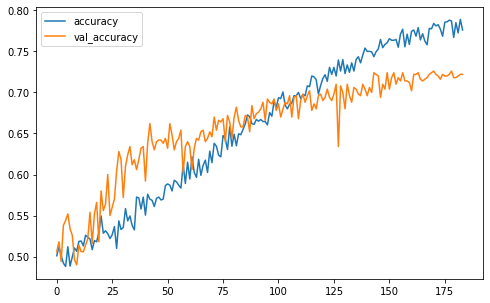

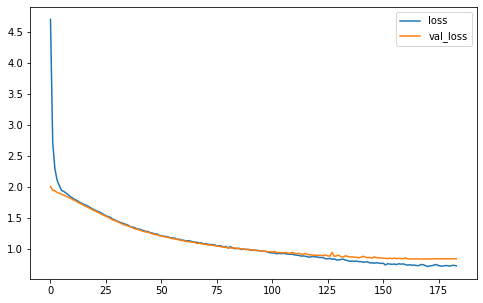

In [25]:
#Curvas modelo CON aumento de datos
plot_model(history_B_DA)

Evaluamos los dos modelos B entrenados.

In [26]:
#Sin DA
model_B.evaluate(test_ds, callbacks=callbacks_B)

16/16 [==============================] - 1s 29ms/step - loss: 0.7752 - accuracy: 0.7420


[0.7752408981323242, 0.7419999837875366]

In [27]:
#Con DA
model_B_DA.evaluate(test_ds, callbacks=callbacks_B)

16/16 [==============================] - 1s 30ms/step - loss: 0.7965 - accuracy: 0.7160


[0.7965271472930908, 0.7160000205039978]

De nuevo, tras varios entrenamientos con aumento y sin aumento de datos, observamos que no hay diferencias significativas en los resultados.

Visualizamos ahora los mapas de características y activación de las primeras y últimas capas del modelo con aumento de datos:

In [ ]:
model_B_DA.layers

Mapa de activación a la salida de la segunda capa convolucional:

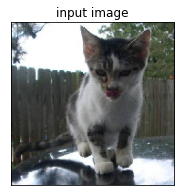

Salidas capa conv2d_5 (1, 90, 90, 32)


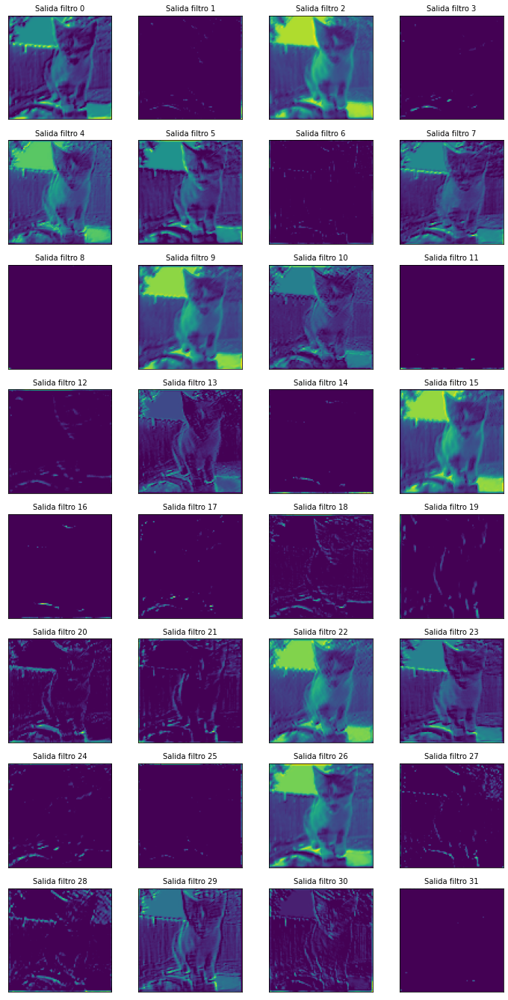

In [ ]:
generate_layers_map(img,3,model_B_DA)

Mapa de activación después de la última capa de pooling:

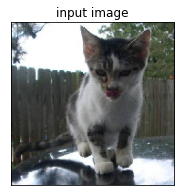

Salidas capa average_pooling2d_4 (1, 5, 5, 256)


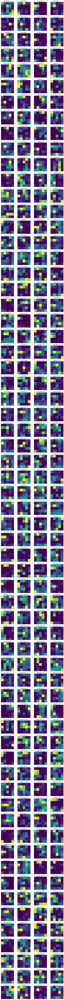

In [ ]:
generate_layers_map(img,10,model_B_DA)

Visualizamos los mapas de características de las distintas capas:

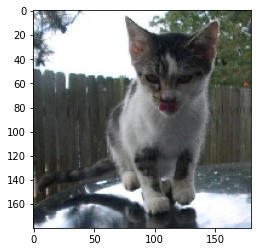

(1, 180, 180, 3)
Predicted class is: [[0.93916726 0.06083276]]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:54: UserWarning:

Attempting to set identical bottom == top == -0.5 results in singular transformations; automatically expanding.

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:42: RuntimeWarning:

invalid value encountered in true_divide



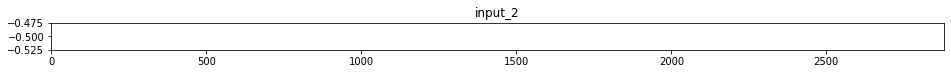

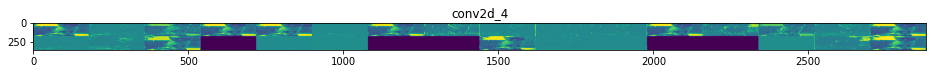

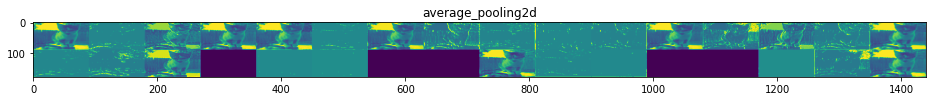

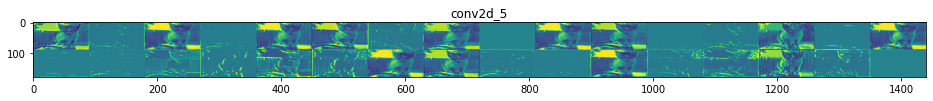

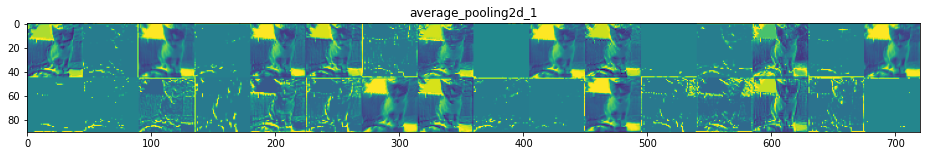

...

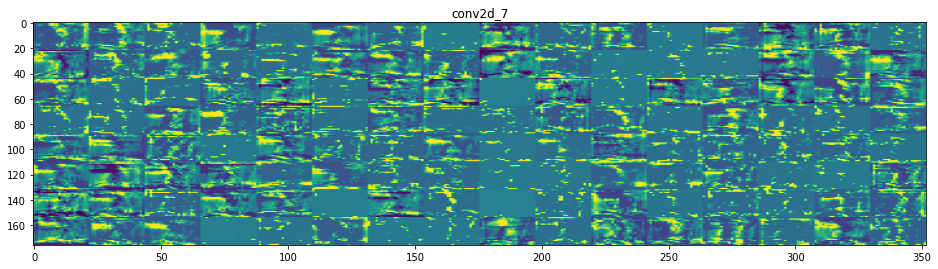

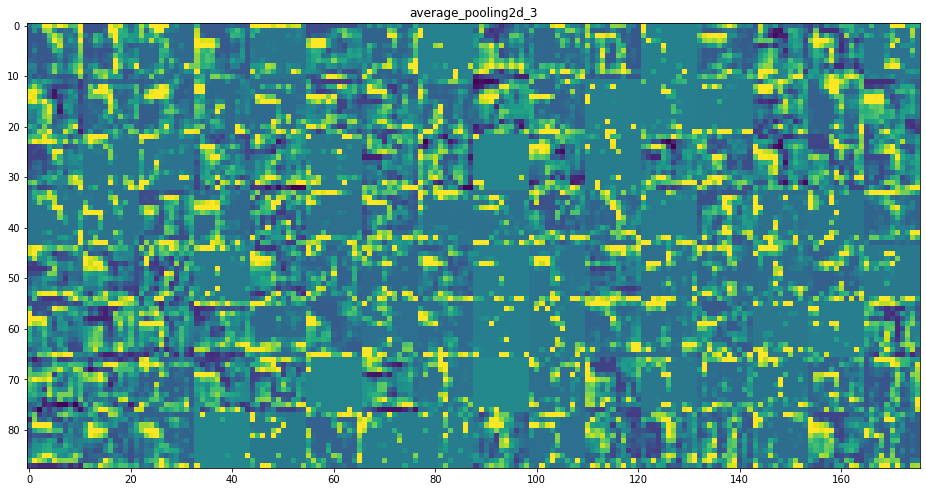

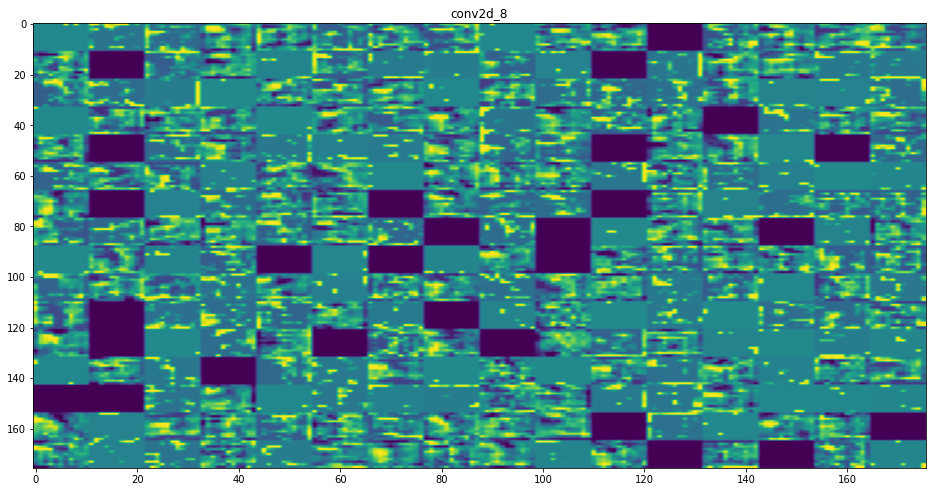

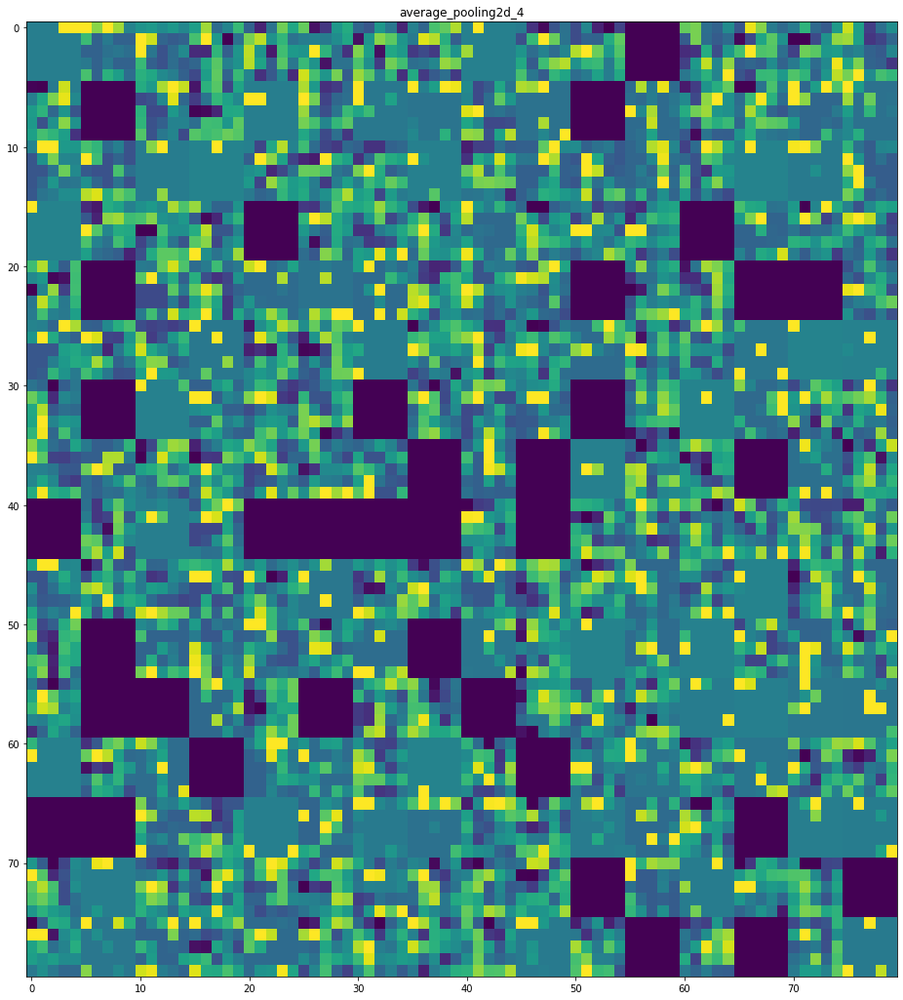

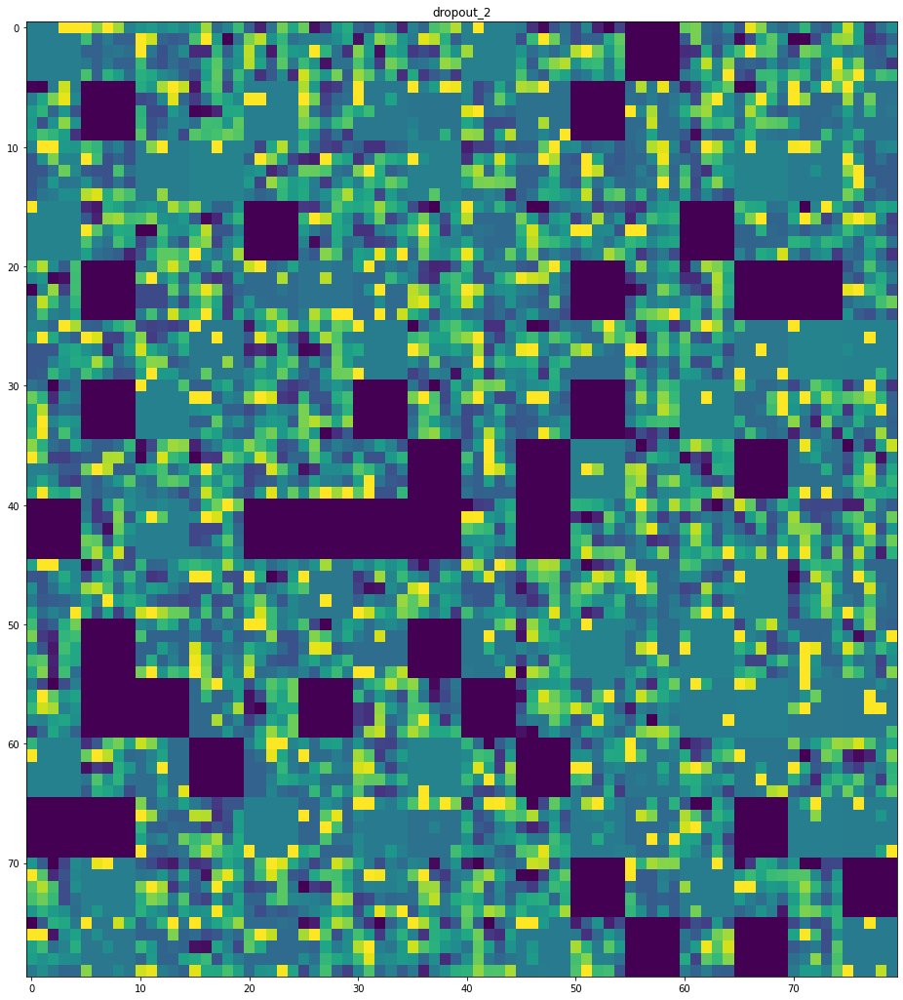

In [ ]:
generate_feature_map(model_B)

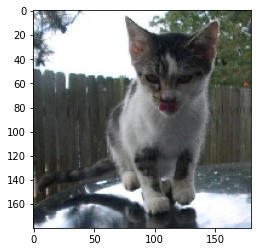

(1, 180, 180, 3)
Predicted class is: [[0.93916726 0.06083276]]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:54: UserWarning:

Attempting to set identical bottom == top == -0.5 results in singular transformations; automatically expanding.

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:42: RuntimeWarning:

invalid value encountered in true_divide



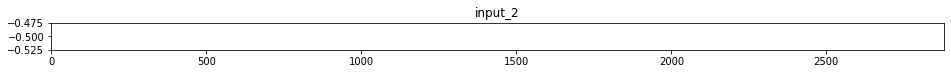

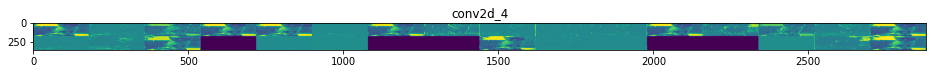

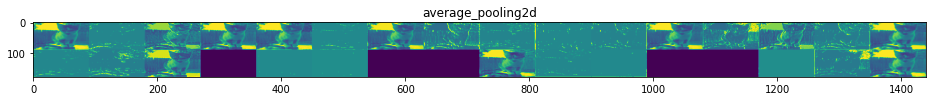

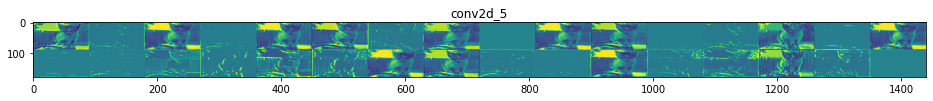

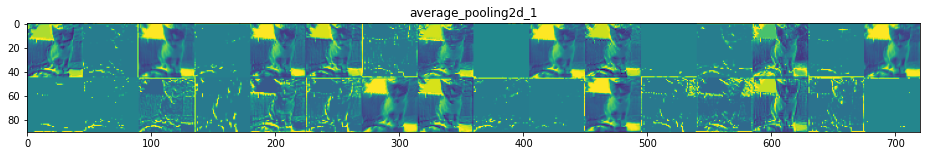

...

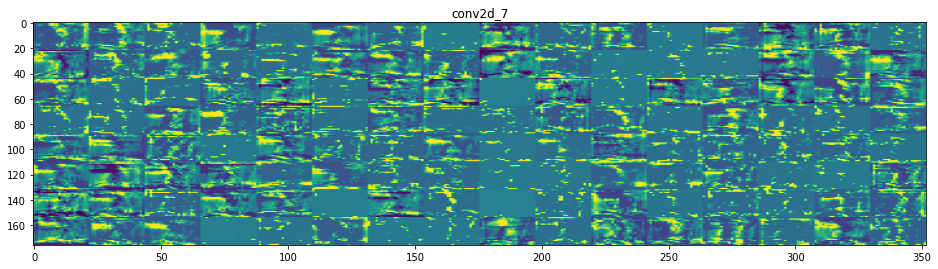

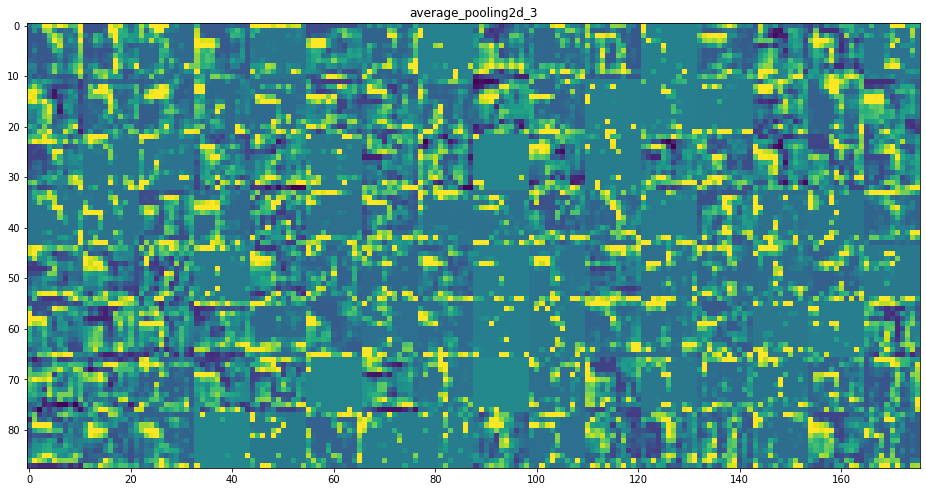

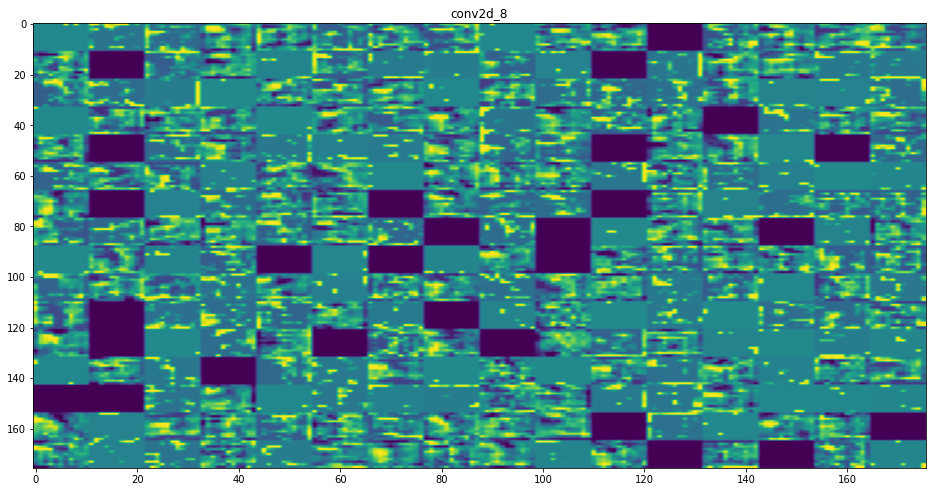

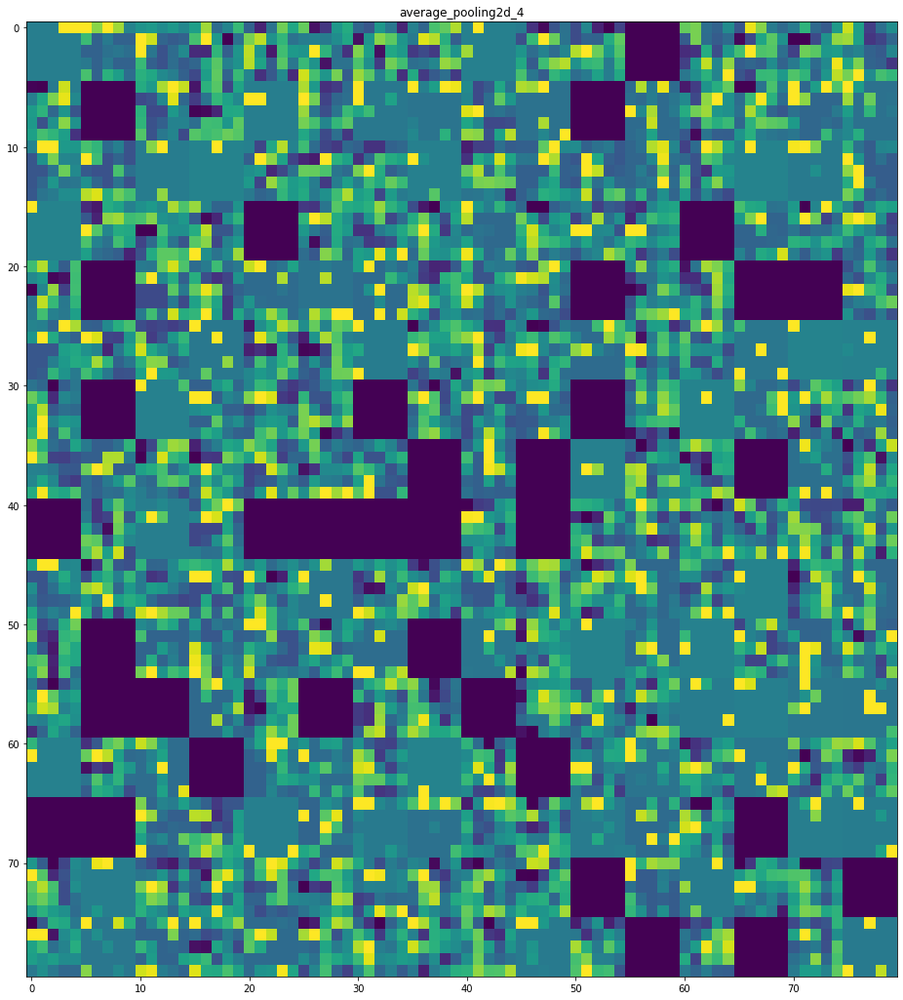

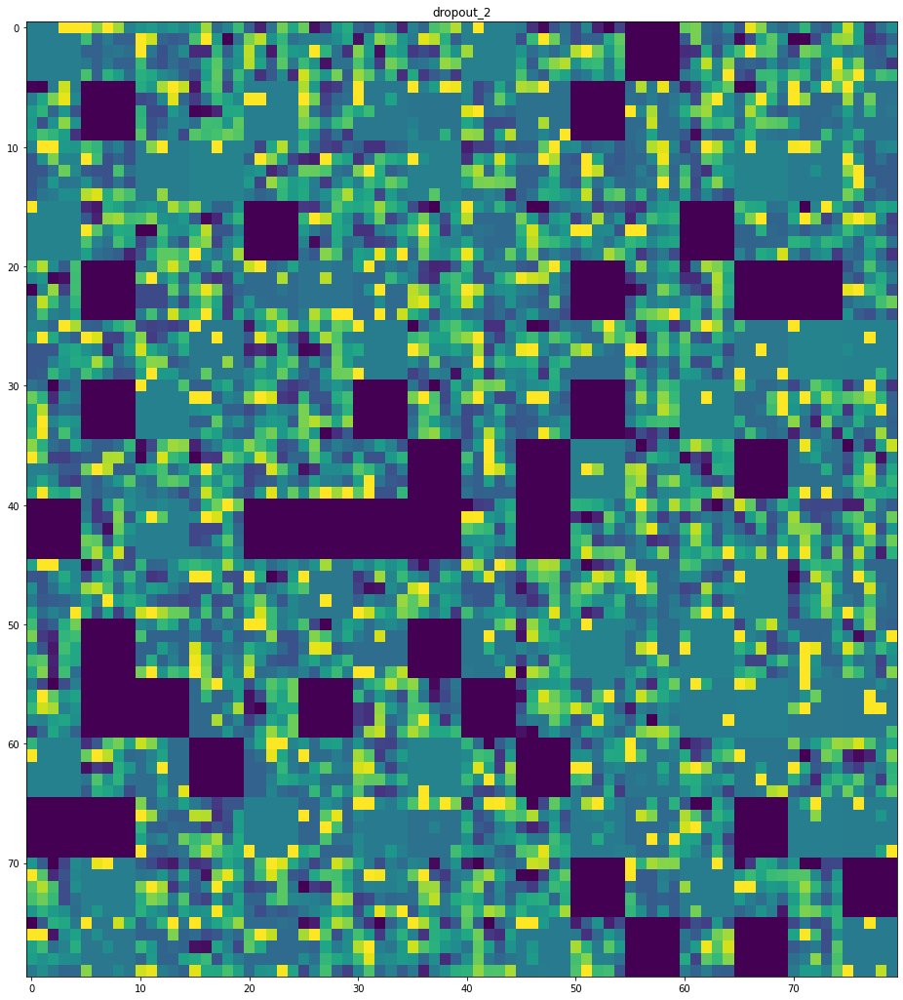

In [ ]:
generate_feature_map(model_B_DA)

## 2.3.- Modelo C

Preparamos las funciones de early stopping y control del learning rate, a aplicar durante el entrenamiento:

In [ ]:
from keras.callbacks import EarlyStopping, ReduceLROnPlateau
earlystop = EarlyStopping(patience=8, verbose=1)
learning_rate_reduction = ReduceLROnPlateau(monitor='val_accuracy', 
                                            patience=2, 
                                            verbose=1, 
                                            factor=0.5, 
                                            min_lr=0.00001)
callbacks_C = [earlystop, learning_rate_reduction]

Definimos el modelo C:

In [ ]:
# Modelo C
def mod_C():
  input_layer_C = keras.layers.Input(shape=(180, 180, 3))
  rescaling_C = keras.layers.Rescaling(scale=1./255)(input_layer_C)

  conv_layer_C = keras.layers.Conv2D(32, kernel_size=(3, 3), input_shape=(180, 180, 3), activation='relu')(rescaling_C)
  batch_C = keras.layers.BatchNormalization()(conv_layer_C)                                 
  pooling_C = keras.layers.MaxPooling2D(pool_size=(2,2))(batch_C)

  conv_layer_2_C = keras.layers.Conv2D(64, kernel_size=(3, 3), activation='relu')(pooling_C)
  batch_2_C = keras.layers.BatchNormalization()(conv_layer_2_C)
  pooling_2_C = keras.layers.MaxPooling2D(pool_size=(2,2))(batch_2_C)

  conv_layer_3_C = keras.layers.Conv2D(128, kernel_size=(3, 3), activation='relu')(pooling_2_C)
  batch_3_C = keras.layers.BatchNormalization()(conv_layer_3_C)
  pooling_3_C = keras.layers.MaxPooling2D(pool_size=(2,2))(batch_3_C)

  dropout_C = keras.layers.Dropout(0.5)(pooling_3_C)
  flatten_C = keras.layers.Flatten()(dropout_C)
  dense_1_C = keras.layers.Dense(256, activation='relu')(flatten_C) #, kernel_regularizer='l2'?
  dropout_2_C = keras.layers.Dropout(0.5)(dense_1_C)
  output_C = keras.layers.Dense(2, activation='softmax')(dropout_2_C)

  return keras.Model(inputs=input_layer_C, outputs=output_C)

Compilamos y entrenamos el modelo C **con** aumento de datos en el conjunto de validación:

In [ ]:
# Modelo C con aumento de datos
model_C_DA = mod_C()
model_C_DA.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model_C_DA.summary()

Model: "model_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 180, 180, 3)]     0         
                                                                 
 rescaling_1 (Rescaling)     (None, 180, 180, 3)       0         
                                                                 
 conv2d_9 (Conv2D)           (None, 178, 178, 32)      896       
                                                                 
 batch_normalization_7 (Batc  (None, 178, 178, 32)     128       
 hNormalization)                                                 
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 89, 89, 32)       0         
 2D)                                                             
                                                                 
 conv2d_10 (Conv2D)          (None, 87, 87, 64)        184

In [ ]:
history_C_DA = model_C_DA.fit(train_ds, validation_data=validation_DA_ds, epochs=40, callbacks=callbacks_C)

Epoch 1/40
63/63 [==============================] - 6s 76ms/step - loss: 5.8151 - accuracy: 0.5585 - val_loss: 1.9779 - val_accuracy: 0.5500 - lr: 0.0010
Epoch 2/40
63/63 [==============================] - 5s 68ms/step - loss: 1.2553 - accuracy: 0.5710 - val_loss: 2.5376 - val_accuracy: 0.5120 - lr: 0.0010
Epoch 3/40
62/63 [============================>.] - ETA: 0s - loss: 0.7872 - accuracy: 0.6270
Epoch 00003: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
63/63 [==============================] - 5s 68ms/step - loss: 0.7871 - accuracy: 0.6265 - val_loss: 1.1061 - val_accuracy: 0.5060 - lr: 0.0010
Epoch 4/40
63/63 [==============================] - 5s 68ms/step - loss: 0.6246 - accuracy: 0.6810 - val_loss: 1.1925 - val_accuracy: 0.5540 - lr: 5.0000e-04
Epoch 5/40
63/63 [==============================] - 5s 68ms/step - loss: 0.5487 - accuracy: 0.7090 - val_loss: 1.0612 - val_accuracy: 0.5700 - lr: 5.0000e-04
Epoch 6/40
63/63 [==============================] - 5s 68ms

Visualizamos la evolución de las métricas y las pérdidas del train y validation_DA:

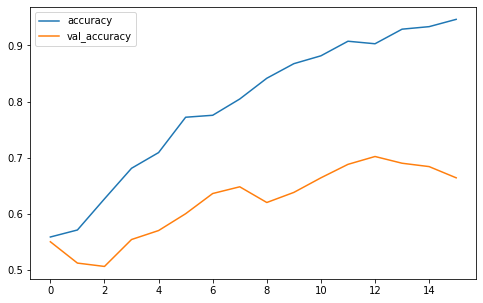

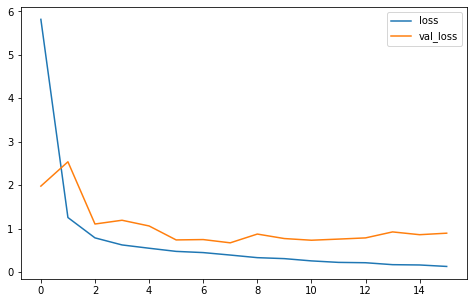

In [ ]:
# Curvas modelo CON aumento de datos
plot_model(history_C_DA)

Repetimos el procedimiento esta vez **sin** aumento de datos en el conjunto de validación:

In [ ]:
# Modelo C sin aumento de datos
model_C = mod_C()
model_C.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model_C.summary()

Model: "model_14"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 180, 180, 3)]     0         
                                                                 
 rescaling_2 (Rescaling)     (None, 180, 180, 3)       0         
                                                                 
 conv2d_12 (Conv2D)          (None, 178, 178, 32)      896       
                                                                 
 batch_normalization_10 (Bat  (None, 178, 178, 32)     128       
 chNormalization)                                                
                                                                 
 max_pooling2d_7 (MaxPooling  (None, 89, 89, 32)       0         
 2D)                                                             
                                                                 
 conv2d_13 (Conv2D)          (None, 87, 87, 64)        184

In [ ]:
history_C = model_C.fit(train_ds, validation_data=validation_ds, epochs=40, callbacks=callbacks_C)

Epoch 1/40
63/63 [==============================] - 5s 71ms/step - loss: 4.9579 - accuracy: 0.5445 - val_loss: 2.4156 - val_accuracy: 0.5000 - lr: 0.0010
Epoch 2/40
63/63 [==============================] - 5s 67ms/step - loss: 0.8382 - accuracy: 0.6095 - val_loss: 1.4879 - val_accuracy: 0.4700 - lr: 0.0010
Epoch 3/40
62/63 [============================>.] - ETA: 0s - loss: 0.7030 - accuracy: 0.6487
Epoch 00003: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
63/63 [==============================] - 5s 68ms/step - loss: 0.7017 - accuracy: 0.6495 - val_loss: 9.3952 - val_accuracy: 0.5000 - lr: 0.0010
Epoch 4/40
63/63 [==============================] - 5s 67ms/step - loss: 0.5542 - accuracy: 0.7070 - val_loss: 3.4594 - val_accuracy: 0.5080 - lr: 5.0000e-04
Epoch 5/40
63/63 [==============================] - 5s 68ms/step - loss: 0.4746 - accuracy: 0.7560 - val_loss: 1.7104 - val_accuracy: 0.5100 - lr: 5.0000e-04
Epoch 6/40
63/63 [==============================] - 5s 67ms

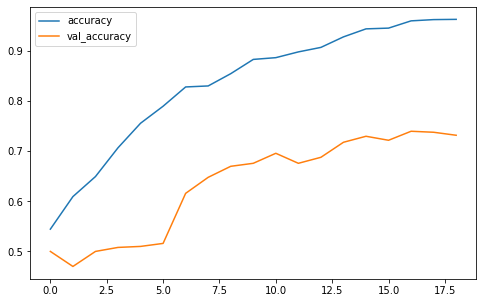

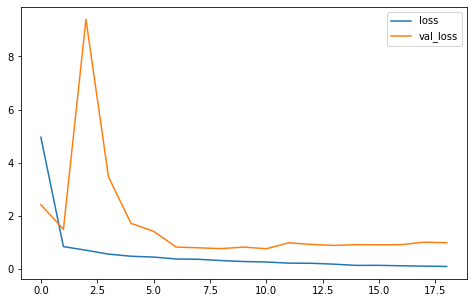

In [ ]:
# Curvas modelo SIN aumento de datos
plot_model(history_C)

Evaluación de los dos modelos C.

In [ ]:
# SIN DA
scores_C = model_C.evaluate(test_ds, callbacks=callbacks_C)

16/16 [==============================] - 1s 33ms/step - loss: 0.7888 - accuracy: 0.7400


In [ ]:
# CON DA
scores_C_DA = model_C_DA.evaluate(test_ds, callbacks=callbacks_C)

16/16 [==============================] - 1s 33ms/step - loss: 0.7172 - accuracy: 0.7340


Finalmente, tras múltiples entrenamientos vemos que no hay diferencias significativas entre los resultados con y sin aumento de datos.

Visualizamos los mapas de características de primeras y últimas capas del modelo con aumento de datos:

In [ ]:
model_C_DA.layers

Mapa de activación directamente a la salida de la primera capa convolucional.

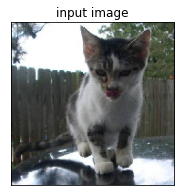

Salidas capa conv2d_9 (1, 178, 178, 32)


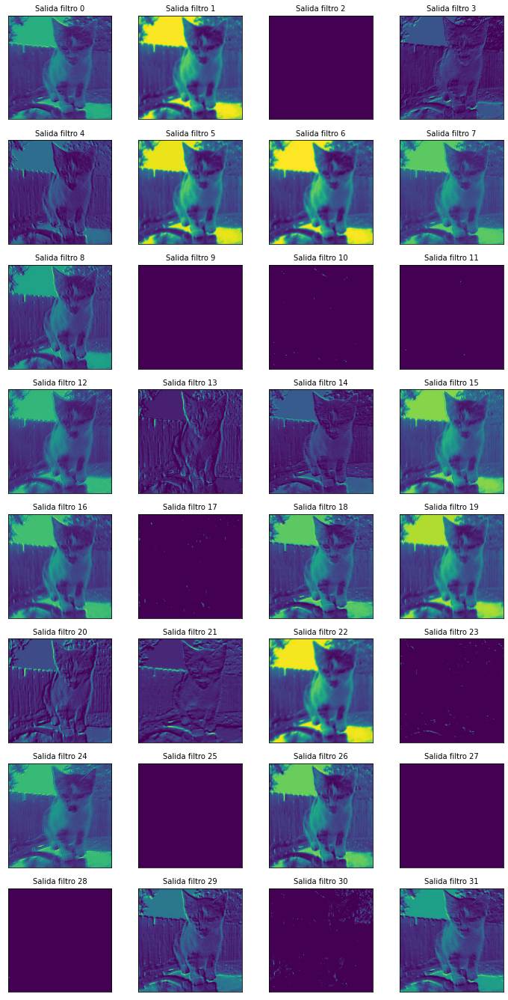

In [ ]:
generate_layers_map(img,2,model_C_DA)

Mapa de activación después del batch normalization y max pooling de la tercera y última capa convolucional:

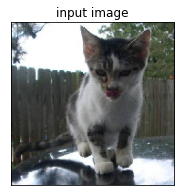

Salidas capa max_pooling2d_6 (1, 20, 20, 128)


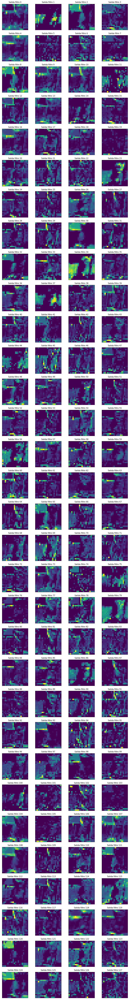

In [ ]:
generate_layers_map(img,10,model_C_DA)

Visualizamos los mapas de características de las distintas capas:

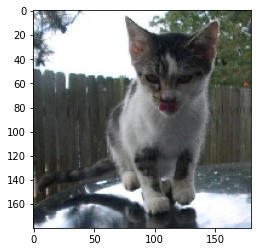

(1, 180, 180, 3)
Predicted class is: [[0.99870265 0.00129739]]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:54: UserWarning:

Attempting to set identical bottom == top == -0.5 results in singular transformations; automatically expanding.

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:42: RuntimeWarning:

invalid value encountered in true_divide

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:42: RuntimeWarning:

divide by zero encountered in true_divide



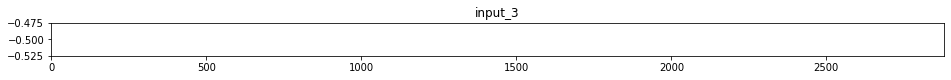

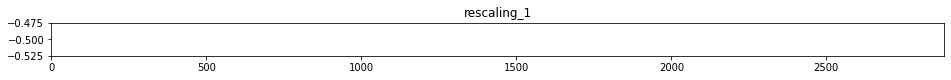

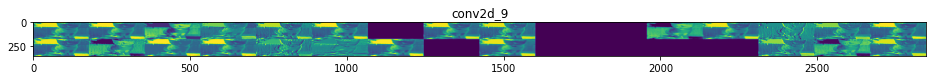

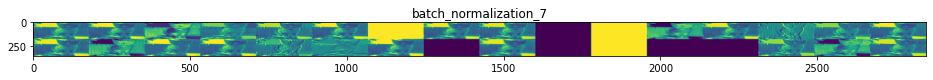

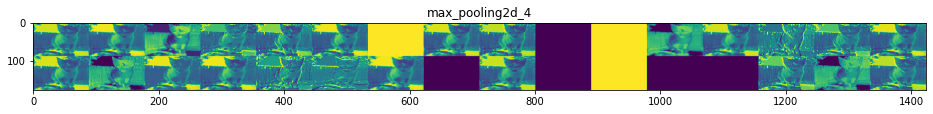

...

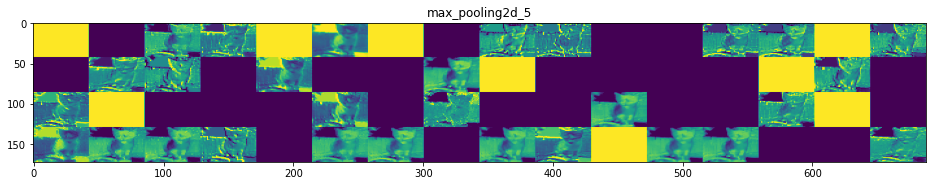

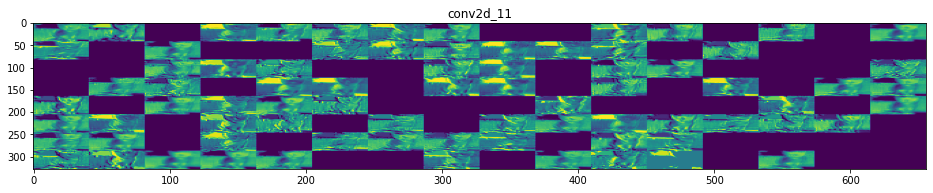

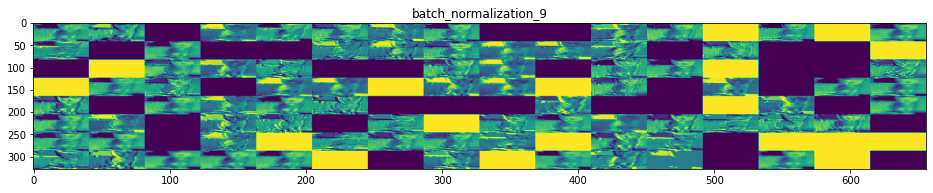

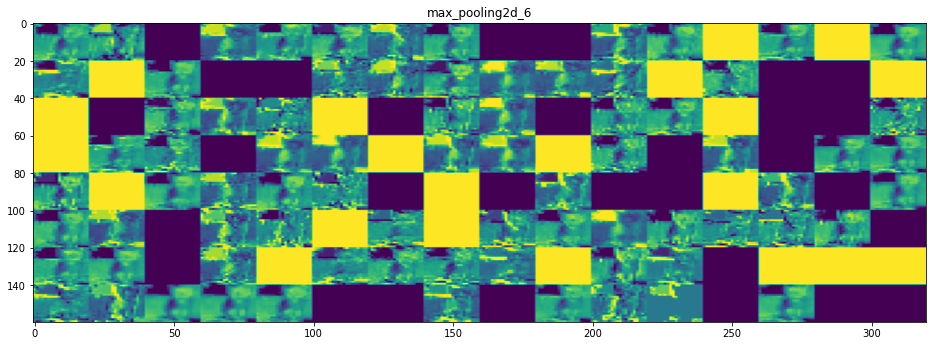

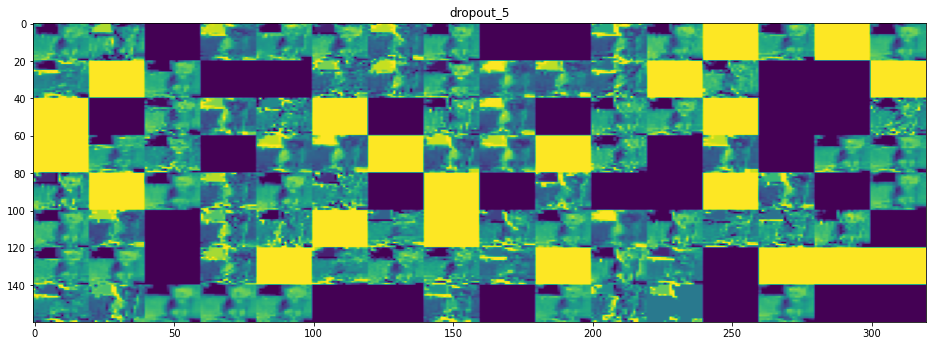

In [ ]:
generate_feature_map(model_C_DA)

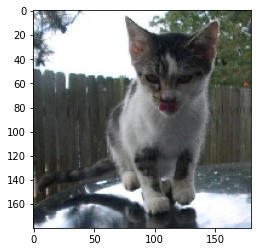

(1, 180, 180, 3)
Predicted class is: [[9.999416e-01 5.835812e-05]]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:54: UserWarning:

Attempting to set identical bottom == top == -0.5 results in singular transformations; automatically expanding.

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:42: RuntimeWarning:

invalid value encountered in true_divide

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:42: RuntimeWarning:

divide by zero encountered in true_divide



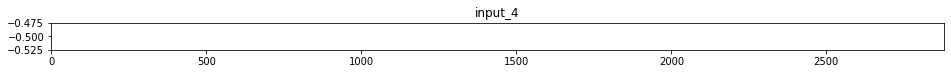

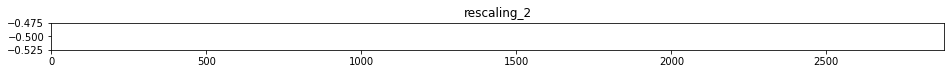

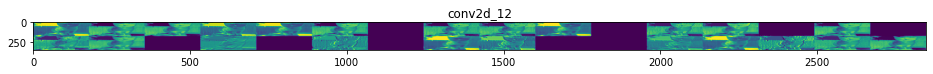

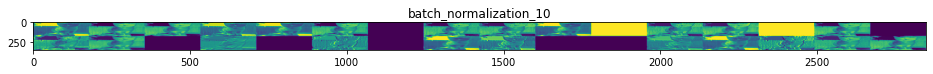

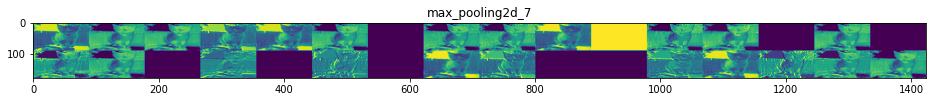

...

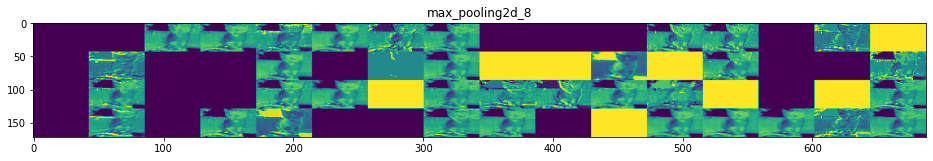

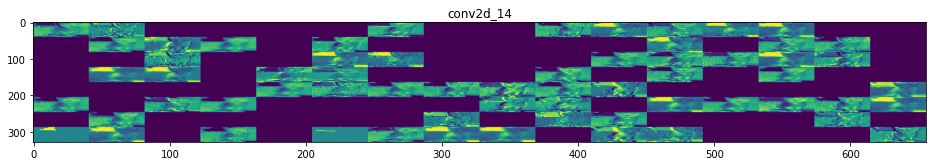

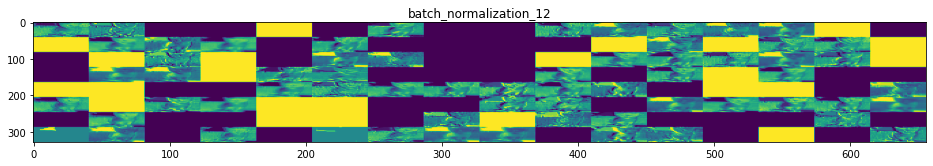

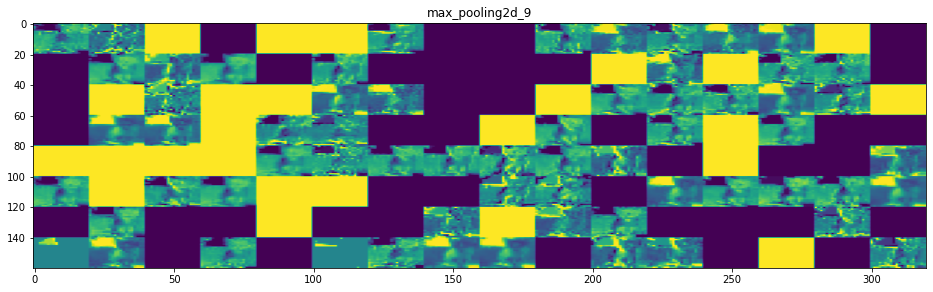

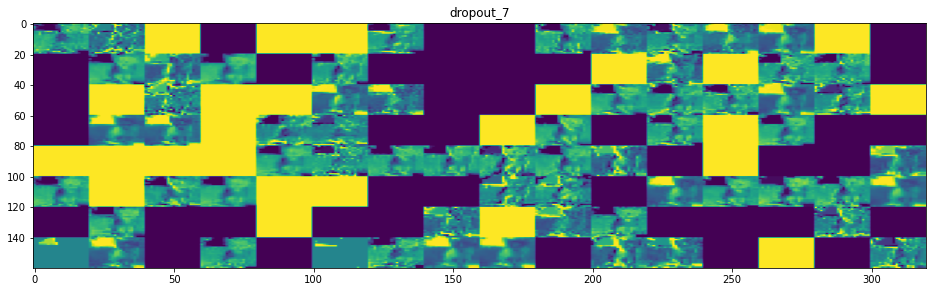

In [ ]:
generate_feature_map(model_C)

# 3.- Selección del mejor modelo y conclusiones

Después de entrenar 3 arquitecturas distintas, el modelo escogido es el B, pues es el que ha obtenido la mayor puntuación de todos.

Este modelo cuenta con cinco bloques convolucionales, formados por una capa de convolución 2D más una capa de pooling para reducir las dimensiones. Después se ha usado una de dropout y otra flatten. Finalmente, en el bloque totalmente conectado, empleamos dos capas densas, cada una seguida de una capa de dropout como técnica de regularización y, por último, una capa de clasificación con la función softmax a la salida.

En general, tras realizar entrenamientos con los diferentes modelos, hemos detectado que es difícil evitar el sobreajuste debido a la naturaleza de los datos del conjunto de perros y gatos. Este modelo es el que mejor ajusta de los tres, algo que se ha conseguido principalmente jugando con el número de épocas y con una tasa de aprendizaje muy baja.

Respecto a los mapas de características o activación, en las primeras capas de los modelos observamos que se resaltan principalmente características generales como bordes y líneas o el fondo. Al profundizar hacia las últimas capas del modelo, vemos que las salidas se vuelven más abstractas y difusas. En esta imagen del gato que mostramos, las características más prominentes parecen ser las orejas y las patas.